In [3]:
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

import pandas as pd
import datashader as ds
import datashader.transfer_functions as tf

import matplotlib.pyplot as plt

# Generate Time Series

In [136]:
steps = 200
t = np.arange(0, steps)
r_values = [2.8, 3.2, 3.5, 3.8, 4]

In [137]:
r_time_series = np.zeros((len(r_values), len(t)))

r_time_series[:, 0] = np.random.rand(len(r_values))

for i in range(1, steps):
    r_time_series[:, i] = (
        r_values * r_time_series[:, i - 1] * (1 - r_time_series[:, i - 1])
    )

In [138]:
fig = make_subplots(rows=5, cols=1)

for i in range(5):
    fig.add_trace(
        px.line(
            x=t,
            y=r_time_series[i],
            labels={"x": "Step", "y": "Value"},
        ).data[0],
        row=i+1,
        col=1
    )

fig.update_layout(height=800, title_text="Logistic Maps")
fig.show()

# Datasets

In [139]:
num_data = 30
labels = np.repeat([0, 1], num_data)

In [140]:
r_data_full = np.zeros((60, 200))

r_data_full[:, 0] = np.random.rand(num_data * 2)

for i in range(1, steps):
    r_data_full[:num_data, i] = (
        3.2 * r_data_full[:num_data, i - 1] * (1 - r_data_full[:num_data, i - 1])
    )
    r_data_full[num_data:, i] = (
        3.8 * r_data_full[num_data:, i - 1] * (1 - r_data_full[num_data:, i - 1])
    )

r_data = r_data_full[:, -50:]

In [141]:
r_features = np.zeros((60, 4))

r_features[:, 0] = np.mean(r_data, axis=1)
r_features[:, 1] = np.std(r_data, axis=1)
r_features[:, 2] = np.ptp(r_data, axis=1)

correlation_shift = 4
r_center_data = r_data[:] - r_features[:, 0][:, np.newaxis] # Goes from (60,) to (60, 1)
x_n = r_center_data[:, :-correlation_shift]
x_lagged = r_center_data[:, correlation_shift:]
r_features[:, 3] = (x_n * x_lagged).sum(axis=1) / (x_n ** 2).sum(axis=1)

In [142]:
r_features[30:, 1]

array([0.26165655, 0.25534263, 0.25108382, 0.24331259, 0.24359089,
       0.24039765, 0.25074919, 0.24574164, 0.24173368, 0.25566909,
       0.245292  , 0.21805049, 0.25791443, 0.2323457 , 0.25735093,
       0.25155603, 0.2539541 , 0.22738843, 0.24946231, 0.2494927 ,
       0.25980311, 0.24423773, 0.2623256 , 0.23798912, 0.25591963,
       0.24513921, 0.22640378, 0.25446408, 0.2489597 , 0.23748683])

In [143]:
r_features[:10]

array([[0.65625   , 0.14320549, 0.28641098, 1.        ],
       [0.65625   , 0.14320549, 0.28641098, 1.        ],
       [0.65625   , 0.14320549, 0.28641098, 1.        ],
       [0.65625   , 0.14320549, 0.28641098, 1.        ],
       [0.65625   , 0.14320549, 0.28641098, 1.        ],
       [0.65625   , 0.14320549, 0.28641098, 1.        ],
       [0.65625   , 0.14320549, 0.28641098, 1.        ],
       [0.65625   , 0.14320549, 0.28641098, 1.        ],
       [0.65625   , 0.14320549, 0.28641098, 1.        ],
       [0.65625   , 0.14320549, 0.28641098, 1.        ]])

# Log Regress 

In [144]:
X_train, X_test, y_train, y_test = train_test_split(
    r_features, labels, test_size=0.3, random_state=42, stratify=labels
)

In [145]:
model = LogisticRegression()
model.fit(X_train, y_train)

,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add an L2 penalty term and it is the default choice;- `'l1'`: add an L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` and `C` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'`, `l1_ratio` set to any float between 0 and 1 for `penalty='elasticnet'`, and `C=np.inf` for `penalty=None`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation <regularized-logistic-loss>`) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True
,"intercept_scaling intercept_scaling: float, default=1Useful only when the solver `liblinear` is usedand `self.fit_intercept` is set to `True`. In this case, `x` becomes`[x, self.intercept_scaling]`,i.e. a ""synthetic"" feature with constant value equal to`intercept_scaling` is appended to the instance vector.The intercept becomes``intercept_scaling * synthetic_feature_weight``... note:: The synthetic feature weight is subject to L1 or L2 regularization as all other features. To lessen the effect of regularization on synthetic feature weight (and therefore on the intercept) `intercept_scaling` has to be increased.",1
,"class_weight class_weight: dict or 'balanced', default=NoneWeights associated with classes in the form ``{class_label: weight}``.If not given, all classes are supposed to have weight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.Note that these weights will be multiplied with sample_weight (passedthrough the fit method) if sample_weight is specified... versionadded:: 0.17 *class_weight='balanced'*",None
,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag', 'saga' or 'liblinear' to shuffle thedata. See :term:`Glossary <random_state>` for details.",None
,"solver solver: {'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'}, default='lbfgs'Algorithm to use in the optimization problem. Default is 'lbfgs'.To choose a solver, you might want to consider the following aspects:- 'lbfgs' is a good default sol

In [146]:
y_pred = model.predict(X_test)

In [147]:
accuracy = accuracy_score(y_test, y_pred)
accuracy_percentage = accuracy * 100
accuracy_percentage

100.0

# Graph

In [242]:
feature_names = [
    "Mean",
    "Standard Deviation",
    "Peak-to-Peak Range",
    "Autocorrelation (Lag 4)",
]

fig = make_subplots(
    rows=2,
    cols=2,
    subplot_titles=feature_names,
    shared_yaxes=True,
    specs=[
        [{"secondary_y": True}, {"secondary_y": True}],
        [{"secondary_y": True}, {"secondary_y": True}],
    ],
)

for i, name in enumerate(feature_names):
    row = (i // 2) + 1
    col = (i % 2) + 1

    feat_data = r_features[:, i].reshape(-1, 1)

    single_model = LogisticRegression(C=np.inf) # Basically no penalty letting the curves look nice for plot tbh
    single_model.fit(feat_data, labels)

    w = single_model.coef_[0][0] # Coefficient for the actual line
    b = single_model.intercept_[0]

    x_vals = np.linspace(feat_data.min() - 0.05, feat_data.max() + 0.05, 300)
    y_curve = single_model.predict_proba(x_vals.reshape(-1, 1))[:, 1] # index 0 has all the 3.4 while index 1 has all the 3.8

    y_linear = w * x_vals + b

    # y = 0 points or the first half basically
    fig.add_trace(
        go.Scatter(
            x=feat_data[labels == 0].flatten(),
            y=labels[labels == 0],
            mode="markers",
            name="Stable Rows (r=3.2)",
            marker=dict(
                color="blue", size=10, opacity=0.7, line=dict(width=1, color="black")
            ),
            showlegend=(i == 0),
        ),
        row=row, col=col, secondary_y=False
    )

    # y = 1 points or 3.8
    fig.add_trace(
        go.Scatter(
            x=feat_data[labels == 1].flatten(),
            y=labels[labels == 1],
            mode="markers",
            name="Chaotic Rows (r=3.8)",
            marker=dict(
                color="orange", size=10, opacity=0.7, line=dict(width=1, color="black")
            ),
            showlegend=(i == 0),
        ),
        row=row, col=col, secondary_y=False
    )

    # curve
    fig.add_trace(
        go.Scatter(
            x=x_vals,
            y=y_curve,
            mode="lines",
            name="Logistic Curve",
            line=dict(color="red", width=3),
            showlegend=(i == 0),
        ),
        row=row, col=col, secondary_y=False
    )

    # Linear part
    fig.add_trace(
        go.Scatter(
            x=x_vals,
            y=y_linear,
            mode="lines",
            name="Linear Engine (w*x + b)",
            legendgroup="linear",
            line=dict(color="purple", width=1.5, dash="dot"),
            showlegend=(i == 0),
        ),
        row=row, col=col, secondary_y=True,
    )

    # dash middle
    fig.add_shape(
        type="line",
        x0=feat_data.min(),
        y0=0.5,
        x1=feat_data.max(),
        y1=0.5,
        line=dict(color="gray", width=1.5, dash="dash"),
        row=row, col=col
    )

    # Finally got the raw value to center
    max_z = max(abs(y_linear.min()), abs(y_linear.max()))
    fig.update_yaxes(range=[-0.05, 1.05], row=row, col=col, secondary_y=False)
    fig.update_yaxes(
        range=[-max_z * 1.05, max_z * 1.05], row=row, col=col, secondary_y=True
    )

    fig.update_xaxes(title_text=f"Value of {name}", row=row, col=col)

fig.update_layout(
    title_text="Logistic Regression Using Single Features",
    height=800,
    width=1100,
    template="plotly_white",
    hovermode="closest",
)

fig.update_yaxes(tickvals=[0, 0.25, 0.5, 0.75, 1.0], title_text="Prob(Chaos)", col=1, secondary_y=False)
fig.update_yaxes(title_text="Raw Score (z)", col=2, secondary_y=True)

fig.show()

Mean is probably the worst as we can prob see from this. Also it's probably cause when I was looking at the original graphs all of them seem to be centered around the middle meaning the mean seems very similar for all of them.
Also positive relationship for std and pp while negative for mean and autocorrelation.
While having a penalty only autocorrelation has a curve which I think is because of the bigger range it takes up.

In [259]:
data_matrix = np.column_stack((r_features, labels))
feature_names = ["Mean", "Std Dev", "Peak-to-Peak", "Autocorr", "Is_Chaotic"]

corr_matrix = np.corrcoef(data_matrix, rowvar=False)

px.imshow(
    corr_matrix,
    x=feature_names,
    y=feature_names,
    color_continuous_scale="Viridis",
    text_auto=".2f",
    title="Feature Correlation Heatmap (All Dimensions)",
).show()

Looking at the last row shows how pp and std are very similar. We end up seeing how std, pp, and autocorellatioon have strong corellation with the is_chaotic. While mean is def the weakest which we could tell from the graphs above.

## Bifurcation Map

Need to basically compress the time series I did before and put it as one x or r values on the bottom.

Gonna have 1000 r_vals and for each one we have 200 points. So we need to have for x we neeed like 200 of the same r vals while we have varyign y actual value. So instead of (1000, 200) we have it all in 1D. So flatting and repeat the values.

In [30]:
r_values_bifur = np.linspace(2.5, 4.0, 1000)

In [31]:
r_time_series_bifur = np.zeros((len(r_values_bifur), len(t)))

r_time_series_bifur[:, 0] = np.random.rand(len(r_values_bifur))

for i in range(1, steps):
    r_time_series_bifur[:, i] = (
        r_values_bifur * r_time_series_bifur[:, i - 1] * (1 - r_time_series_bifur[:, i - 1])
    )

In [298]:
px.scatter(x=np.repeat(r_values_bifur, steps), y=r_time_series_bifur.flatten())

Cut down the start and keep the transient

In [32]:
transient_steps = 50
r_time_series_bifur_transient = r_time_series_bifur[:, -transient_steps:]

In [300]:
px.scatter(
    x=np.repeat(r_values_bifur, transient_steps),
    y=r_time_series_bifur_transient.flatten(),
)

In [33]:
go.Figure(
    data=[
        go.Scattergl(
            x=np.repeat(r_values_bifur, transient_steps),
            y=r_time_series_bifur_transient.flatten(),
            mode="markers",
            marker=dict(size=1)
        )
    ]
).show()

Need to stop storing so much

In [102]:
r_values_bifur = np.linspace(3.5, 4, 5000)
transient_steps = 50

r_time_series_bifur = np.zeros((len(r_values_bifur), transient_steps))

initial_conditions = np.random.rand(len(r_values_bifur))

for i in range(0, steps - transient_steps):
    initial_conditions = (
        r_values_bifur
        * initial_conditions
        * (1 - initial_conditions)
    )

r_time_series_bifur[:, 0] = initial_conditions
for i in range(1, transient_steps):
    r_time_series_bifur[:, i] = (
        r_values_bifur
        * r_time_series_bifur[:, i - 1]
        * (1 - r_time_series_bifur[:, i - 1])
    )

In [114]:
go.Figure(
    data=[
        go.Scattergl(
            x=np.repeat(r_values_bifur, transient_steps),
            y=r_time_series_bifur.flatten(),
            mode="markers",
            marker=dict(size=0.8, opacity=0.8, color="white"),
        )
    ],
    layout=go.Layout(
        height=700,
        template="plotly_dark",  # Forces a clean, white background
        xaxis=dict(showgrid=False),  # Removes vertical gridlines
        yaxis=dict(showgrid=False),  # Removes horizontal gridlines
    ),
).show()

Saw another method where he starts with an intial point and an intial r. Instead of running every single one he keep slowly increasing r which keeps his info 1D and also stops the transient stuff I do. https://blbadger.github.io/logistic-map#aperiodic-trajectories-in-the-logistic-map

In [ ]:
steps = 15_000_000
r_values = np.linspace(3.55, 4.0, steps)
x_values = np.zeros(steps)
x_values[0] = np.random.rand()

for i in range(1, steps):
    x_values[i] = r_values[i - 1] * x_values[i - 1] * (1 - x_values[i - 1])

plt.style.use("dark_background")
plt.figure(figsize=(12, 8))

plt.plot(r_values, x_values, ",", color="white", alpha=0.013) # , is like one pixel

plt.title("Bifurcation Diagram")
plt.xlabel("r")
plt.ylabel("X")
plt.show()

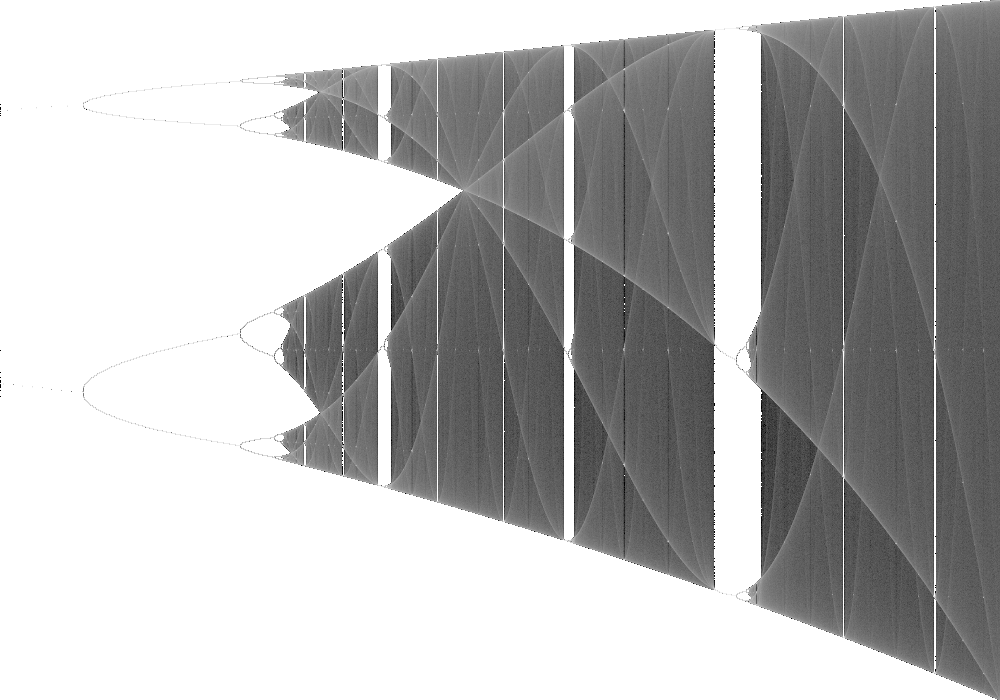

In [ ]:
steps = 30_000_000
r_values = np.linspace(3.4, 4.0, steps)
x_values = np.zeros(steps)
x_values[0] = np.random.rand()

for i in range(1, steps):
    x_values[i] = r_values[i - 1] * x_values[i - 1] * (1 - x_values[i - 1])

df = pd.DataFrame({"r": r_values, "x": x_values})

# Found data shader lowkey helps plot lots of poitns
canvas = ds.Canvas(plot_width=1000, plot_height=700)
agg = canvas.points(df, "r", "x")
img = tf.shade(agg, cmap=["black", "white"], how="log")

img

# Other ideas

In [52]:
steps = 200
t = np.arange(0, steps)
num_data = 30
labels = np.repeat([0, 1], num_data)

In [53]:
r_data_full = np.zeros((60, 200))

r_data_full[:, 0] = np.random.rand(num_data * 2)

r_vals = np.repeat([3.2, 3.8], num_data)

for i in range(1, steps):
    r_data_full[:, i] = (
        r_vals * r_data_full[:, i - 1] * (1 - r_data_full[:, i - 1])
    )

r_data = r_data_full[:, -50:]

In [54]:
X_train, X_test, y_train, y_test = train_test_split(
    r_data, labels, test_size=0.2, random_state=42, stratify=labels
)
model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [55]:
accuracy = accuracy_score(y_test, y_pred)
accuracy_percentage = accuracy * 100
accuracy_percentage

50.0

In [64]:
all_accuracies = []

for i in range(30):
    r_data_full = np.zeros((60, 200))
    r_data_full[:, 0] = np.random.rand(num_data * 2)
    r_vals = np.repeat([3.2, 3.8], num_data)
    for i in range(1, steps):
        r_data_full[:, i] = (
            r_vals * r_data_full[:, i - 1] * (1 - r_data_full[:, i - 1])
        )
    r_data = r_data_full[:, -50:]

    X_train, X_test, y_train, y_test = train_test_split(
        r_data, labels, test_size=0.2, random_state=42, stratify=labels
    )
    model = LogisticRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    accuracy_percentage = accuracy * 100
    all_accuracies.append(accuracy_percentage)

print(all_accuracies[:3])
print(np.mean(all_accuracies))

[75.0, 75.0, 41.66666666666667]
60.277777777777764


Was trying to figure out how to plot but can't seem to figure it out but underneath just gave it the x^2 values since when finding r it does rx and rx^2 so giving it stragiht to it will hopefully make it easier since it can only see linear relations

In [68]:
all_accuracies = []

for i in range(30):
    r_data_full = np.zeros((60, 200))
    r_data_full[:, 0] = np.random.rand(num_data * 2)
    r_vals = np.repeat([3.2, 3.8], num_data)
    for i in range(1, steps):
        r_data_full[:, i] = r_vals * r_data_full[:, i - 1] * (1 - r_data_full[:, i - 1])
    r_data = r_data_full[:, -50:]
    r_data = np.hstack((r_data, r_data**2))

    X_train, X_test, y_train, y_test = train_test_split(
        r_data, labels, test_size=0.2, random_state=42, stratify=labels
    )
    model = LogisticRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    accuracy_percentage = accuracy * 100
    all_accuracies.append(accuracy_percentage)

print(all_accuracies[:3])
print(np.mean(all_accuracies))

[58.333333333333336, 50.0, 66.66666666666666]
66.94444444444444


In [ ]:
all_accuracies = []

for i in range(30):
    r_data_full = np.zeros((60, 200))
    r_data_full[:, 0] = np.random.rand(num_data * 2)
    r_vals = np.repeat([3.2, 3.8], num_data)
    for i in range(1, steps):
        r_data_full[:, i] = r_vals * r_data_full[:, i - 1] * (1 - r_data_full[:, i - 1])
    r_data = r_data_full[:, -50:]
    r_data = r_data * (1 - r_data)

    X_train, X_test, y_train, y_test = train_test_split(
        r_data, labels, test_size=0.2, random_state=42, stratify=labels
    )
    model = LogisticRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    accuracy_percentage = accuracy * 100
    all_accuracies.append(accuracy_percentage)

print(all_accuracies[:3])
print(np.mean(all_accuracies))

[100.0, 100.0, 100.0]
98.88888888888889


But also had the crazy idea of just giving it the x(1-x) data and it works almost perfectly. Since I'm thiniing plotting these points would put them in a very similar line of slope r. Since all the points lets say are z or z = x(1-x). Then x_(n+1) = rz so plotting all z values would give a straight line of slope r and same for the other data. Then it would make it much easier to have a line that goes in between and is like a deciision boudayr. Basically since this plot has straight lines a straight line can easily seperate it compared to plotting quadrating data and trying to have a straight line cut it cleanly. Basically if we can't make the line quadratic we could make the data linear.

# Want to try one v all

In [150]:
steps = 200
r_values = [2.8, 3.2, 3.5, 3.8, 4]
r_values_len = len(r_values)
num_data = 30

In [151]:
r_labels = np.eye(r_values_len)[np.repeat(np.arange(r_values_len), num_data)]

r_data_full = np.zeros((r_values_len * num_data, steps))
r_data_full[:, 0] = np.random.rand(num_data * r_values_len)
r_vals = np.repeat([2.8, 3.2, 3.5, 3.8, 4], num_data)
for i in range(1, steps):
    r_data_full[:, i] = r_vals * r_data_full[:, i - 1] * (1 - r_data_full[:, i - 1])
    r_data = r_data_full[:, -50:]

In [152]:
r_features = np.zeros((r_values_len * num_data, 4))

r_features[:, 0] = np.mean(r_data, axis=1)
r_features[:, 1] = np.std(r_data, axis=1)
r_features[:, 2] = np.ptp(r_data, axis=1)

correlation_shift = 4
r_center_data = (
    r_data[:] - r_features[:, 0][:, np.newaxis]
)
x_n = r_center_data[:, :-correlation_shift]
x_lagged = r_center_data[:, correlation_shift:]
r_features[:, 3] = (x_n * x_lagged).sum(axis=1) / ((x_n**2).sum(axis=1) + 1e-9)

In [153]:
X_train, X_test, y_train, y_test = train_test_split(
    r_features, r_labels, test_size=0.2, random_state=42, stratify=r_labels
)

In [161]:
all_models = []
model_pred_list = []

for i, r_val in enumerate(r_values):
    model = LogisticRegression()
    model.fit(X_train, y_train[:, i])
    all_models.append(model)

    prob = model.predict_proba(X_test)
    model_pred_list.append(prob[:, 1])

model_pred = np.column_stack(model_pred_list)

In [162]:
y_pred = np.zeros_like(model_pred)

max_indices = np.argmax(model_pred, axis=1)
row_indices = np.arange(len(model_pred))

y_pred[row_indices, max_indices] = 1

In [164]:
accuracy = accuracy_score(y_test, y_pred)
accuracy_percentage = accuracy * 100
accuracy_percentage

100.0